In [1]:
#Import necessary libraries
#Handle data frames
import pandas as pd
#Handle geo data frames (data frames with geometry)
import geopandas as gpd
#Operations on geometries
import shapely
from shapely.geometry import Polygon, Point
from shapely import speedups
from shapely.ops import unary_union
#Fast vectorized operations
import shapely.vectorized as sv
#Arrays and maths
import numpy as np
import math
from scipy.stats import pearsonr
#Handle netCDF4 data
import xarray as xr
#Plotting
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap,ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import Normalize
from matplotlib import cm
import matplotlib.dates as mdates
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import metpy.calc as mpcalc
import seaborn as sns
#Interactive plots
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from datetime import datetime
from os import listdir
from openpyxl.workbook import Workbook
from functools import reduce
import warnings
warnings.filterwarnings('ignore')
#warnings.filterwarnings(action='once')
sns.set(style='ticks')
%matplotlib inline

In [2]:
#Path to Hydrobasin data
path_HB = "..."

#Path to files with clustering episodes:
#(eps_rY_tZ_wW_XX, XX = HydroBASINS regions, Y = run length in days) Z = threshold, W = time window)
#index of dispersion and quantiles (quantiles_XX)
path = "..."

In [3]:
#Create Hydrobasin world map
hybas_af = gpd.read_file(path_HB + "/hybas_lake_af_lev01-06_v1c/hybas_lake_af_lev06_v1c.shp")
hybas_ar = gpd.read_file(path_HB + "/hybas_lake_ar_lev01-06_v1c/hybas_lake_ar_lev06_v1c.shp")
hybas_as = gpd.read_file(path_HB + "/hybas_lake_as_lev01-06_v1c/hybas_lake_as_lev06_v1c.shp")
hybas_au = gpd.read_file(path_HB + "/hybas_lake_au_lev01-06_v1c/hybas_lake_au_lev06_v1c.shp")
hybas_eu = gpd.read_file(path_HB + "/hybas_lake_eu_lev01-06_v1c/hybas_lake_eu_lev06_v1c.shp")
hybas_gr = gpd.read_file(path_HB + "/hybas_lake_gr_lev01-06_v1c/hybas_lake_gr_lev06_v1c.shp")
hybas_na = gpd.read_file(path_HB + "/hybas_lake_na_lev01-06_v1c/hybas_lake_na_lev06_v1c.shp")
hybas_sa = gpd.read_file(path_HB + "/hybas_lake_sa_lev01-06_v1c/hybas_lake_sa_lev06_v1c.shp")
hybas_si = gpd.read_file(path_HB + "/hybas_lake_si_lev01-06_v1c/hybas_lake_si_lev06_v1c.shp")
#Select only the necessary columns from Hydrobasin dataframe
hybas_data = hybas_af.append([hybas_ar,hybas_as,hybas_au,hybas_eu,hybas_gr,hybas_na,hybas_sa,hybas_si])
hybas_data_gdf = hybas_data[['HYBAS_ID','SUB_AREA','LAKE','COAST','ENDO','geometry']]
#Create mapping for region
key_continent = np.arange(1,10)
continent = dict(zip(key_continent, ["AF","EU","SI","AS","AU","SA","NA","AR","GR"]))

In [4]:
#Load scores for all catchments and all parameters
windows = ['14','21','28']
run_lengths = ['1','2']
thresholds = ['98','99']
eps_gdf = {}
for r in run_lengths:
    for th in thresholds:
        for w in windows:
            name = 'eps_r'+r+'t'+th+'w'+w
            eps_gdf[name] = gpd.GeoDataFrame()
            filepaths = [path + "/" + f for f in listdir(path) if f.startswith(name)]
            temp = pd.concat(map(pd.read_csv, filepaths))
            temp['region_name'] = temp['HYBAS_ID'].astype(str).str[0].astype(int).map(continent)
            temp['time'] = pd.to_datetime(temp['time'])
            reduced = temp.drop_duplicates(['HYBAS_ID'])
            eps_gdf[name] = pd.merge(hybas_data_gdf,reduced,on=['HYBAS_ID'],how='inner')

In [5]:
#Select scores (NS_INC = S_r calculated with incenter method; S_INC = S_cl calculated with incenter method)
NS_list = [col for col in eps_gdf['eps_r2t99w21'] if col.startswith('NS_INC')]
S_list = [col for col in eps_gdf['eps_r2t99w21'] if col.startswith('S_INC')]
scores_list = ['HYBAS_ID'] + S_list + NS_list
S_list_h = ['HYBAS_ID'] + S_list
all_list = ['HYBAS_ID','SUB_AREA','region_name','PK_Max',] + S_list + NS_list

In [6]:
#Merge all data in a single dataframe (final)
base = eps_gdf['eps_r2t99w14'][all_list]
base = base.merge(eps_gdf['eps_r2t99w21'][scores_list],on=['HYBAS_ID'],suffixes=('_r2t99w14', ''),how='inner')
base = base.merge(eps_gdf['eps_r2t99w28'][scores_list],on=['HYBAS_ID'],suffixes=('_r2t99w21', ''),how='inner')
base = base.merge(eps_gdf['eps_r1t99w14'][scores_list],on=['HYBAS_ID'],suffixes=('_r2t99w28', ''),how='inner')
base = base.merge(eps_gdf['eps_r1t99w21'][scores_list],on=['HYBAS_ID'],suffixes=('_r1t99w14', ''),how='inner')
base = base.merge(eps_gdf['eps_r1t99w28'][scores_list],on=['HYBAS_ID'],suffixes=('_r1t99w21', ''),how='inner')
base = base.merge(eps_gdf['eps_r2t98w14'][scores_list],on=['HYBAS_ID'],suffixes=('_r1t99w28', ''),how='inner')
base = base.merge(eps_gdf['eps_r2t98w21'][scores_list],on=['HYBAS_ID'],suffixes=('_r2t98w14', ''),how='inner')
base = base.merge(eps_gdf['eps_r2t98w28'][scores_list],on=['HYBAS_ID'],suffixes=('_r2t98w21', ''),how='inner')
base = base.merge(eps_gdf['eps_r1t98w14'][scores_list],on=['HYBAS_ID'],suffixes=('_r2t98w28', ''),how='inner')
base = base.merge(eps_gdf['eps_r1t98w21'][scores_list],on=['HYBAS_ID'],suffixes=('_r1t98w14', ''),how='inner')
final = base.merge(eps_gdf['eps_r1t98w28'][scores_list],on=['HYBAS_ID'],suffixes=('_r1t98w21', '_r1t98w28'),how='inner')

In [9]:
#Load precipitation quantiles for Figure 2
filepaths = [path + "/" + f for f in listdir(path) if f.startswith('quantiles')]
qnts = pd.concat(map(pd.read_csv, filepaths))
qnts_gdf = pd.merge(hybas_data_gdf,qnts,on=['HYBAS_ID'],how='inner')
qnts_midlat_TP10 = pd.read_csv(path + '/Catchments_midlat_TP10.csv')
qnts_gdf_midlat_TP10 = pd.merge(hybas_data_gdf,qnts_midlat_TP10,on=['HYBAS_ID'],how='inner')

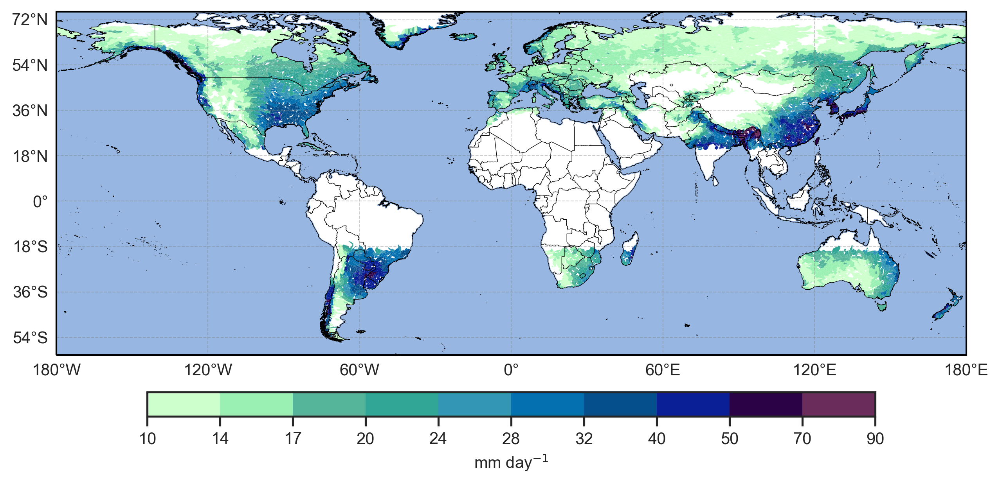

In [78]:
#Figure 2
#Display empirical precipitation quantile of selected catchments
th = 't99'
q = qnts_gdf_midlat_TP10

bnds = q.geometry.bounds
lo_min = math.floor(min(bnds.minx))
lo_max = math.ceil(max(bnds.maxx))
la_min = math.floor(min(bnds.miny))
la_max = math.ceil(max(bnds.maxy))

#cmap = mpl.cm.get_cmap('viridis',11) #(length of bounds - 1)
my_colors = [(247/255,173/255,74/255),(253/255,216/255,118/255),(255/255,237/255,160/255),(237/255,250/255,194/255),
             (205/255,255/255,205/255),(153/255,240/255,178/255),(85/255,181/255,154/255),(50/255,166/255,150/255),
             (50/255,150/255,180/255),(5/255,112/255,176/255),(5/255,80/255,140/255),(10/255,31/255,150/255),
             (44/255,2/255,70/255),(106/255,44/255,90/255),(168/255,65/255,91/255)]
my_colors2 = [(205/255,255/255,205/255),(153/255,240/255,178/255),(85/255,181/255,154/255),(50/255,166/255,150/255),
             (50/255,150/255,180/255),(5/255,112/255,176/255),(5/255,80/255,140/255),(10/255,31/255,150/255),
             (44/255,2/255,70/255),(106/255,44/255,90/255)]
cmap = mpl.colors.ListedColormap(my_colors)
cmap2 = mpl.colors.ListedColormap(my_colors2)
bounds = [0,2,5,8,11,14,17,20,24,28,32,40,50,70,90,110]
bounds2 = [10,14,17,20,24,28,32,40,50,70,90]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
norm2 = mpl.colors.BoundaryNorm(bounds2, cmap2.N)
cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
cbar2 = plt.cm.ScalarMappable(norm=norm2, cmap=cmap2)

projection=ccrs.PlateCarree()

fig = plt.figure(figsize=(10,6),dpi=300)
ax = plt.axes(projection=projection)
ax.set_extent([lo_min,lo_max,la_min-5,la_max+5],projection)

q.plot(ax=ax,column='Th_val',cmap=cmap2,norm=norm2,edgecolor='none',linewidth=0.25,legend=False)

ax.add_feature(cfeature.COASTLINE.with_scale('10m'),linestyle='-',linewidth=0.33)
ax.add_feature(cfeature.BORDERS.with_scale('10m'),linestyle='-',linewidth=0.33)
gl = ax.gridlines(crs=projection, draw_labels=True, linewidth=0.5, color='gray', alpha=0.4, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
ax.add_feature(cfeature.OCEAN.with_scale('10m'))

cb = fig.colorbar(cbar2,ax=ax,orientation='horizontal',fraction=0.05,aspect=30,
                  pad=0.07,ticks=bounds2,spacing='uniform',shrink=0.8)
cb.ax.tick_params(labelsize=10)
cb.set_label(label='mm day$^{-1}$',size=10)

In [24]:
#Table 2
#Compute correlations between Sn and index of dispersion (phi)
r = 2
t = 99
w = 21
name = 'eps_r'+str(r)+'t'+str(t)+'w'+str(w)
name2 = 'DI_r'+str(r)+'t'+str(t)+'w'+str(w)
S = [col for col in eps_gdf[name] if col.startswith('S_')]
S_h = ['HYBAS_ID'] + S
df_corr_S_DI = pd.merge(eps_gdf[name][S_h],
                        phi_gdf[['HYBAS_ID',name2]],on=['HYBAS_ID'],how='inner')
df_corr_S_DI.drop('HYBAS_ID',axis=1).corr(method='spearman').iloc[:,-1]

S_H10          0.755805
S_AVG10        0.785639
S_SQ10         0.779532
S_H15          0.757407
S_AVG15        0.786200
S_SQ15         0.781138
S_H20          0.765266
S_AVG20        0.782180
S_SQ20         0.788076
S_H30          0.791935
S_AVG30        0.764704
S_SQ30         0.816165
S_H50          0.794929
S_AVG50        0.761982
S_SQ50         0.817689
S_INC15        0.782661
S_INC20        0.792005
S_INC30        0.807422
S_INC50        0.815540
DI_r2t99w21    1.000000
Name: DI_r2t99w21, dtype: float64

In [7]:
#Load index of dispersion data for Figure 5 and Appendix D
phi = pd.read_csv(path + "/disp_ind_all.csv")
phi['region_name'] = phi['HYBAS_ID'].astype(str).str[0].astype(int).map(continent)
phi_gdf_temp = pd.merge(hybas_data_gdf,phi,on=['HYBAS_ID'],how='inner')

In [8]:
#Merge all data for index of dispersion
windows = (14,21,28)
run_lengths = (1,2)
thresholds = (98,99)
phi_gdf = phi_gdf_temp.loc[(phi_gdf_temp['w']==14) & (phi_gdf_temp['r']==1) & (phi_gdf_temp['t']==98),['HYBAS_ID','DI','geometry']]
for tw in windows:
    for rl in run_lengths:
        for th in thresholds:
            tmp = phi_gdf_temp.loc[(phi_gdf_temp['w']==tw) & 
                                  (phi_gdf_temp['r']==rl) & (phi_gdf_temp['t']==th),['HYBAS_ID','DI']]
            phi_gdf = phi_gdf.merge(tmp,on=['HYBAS_ID'],suffixes=('','_r' + str(rl) + 't' + str(th) + 'w' + str(tw)),how='inner')
phi_gdf.drop('DI', axis=1, inplace=True)

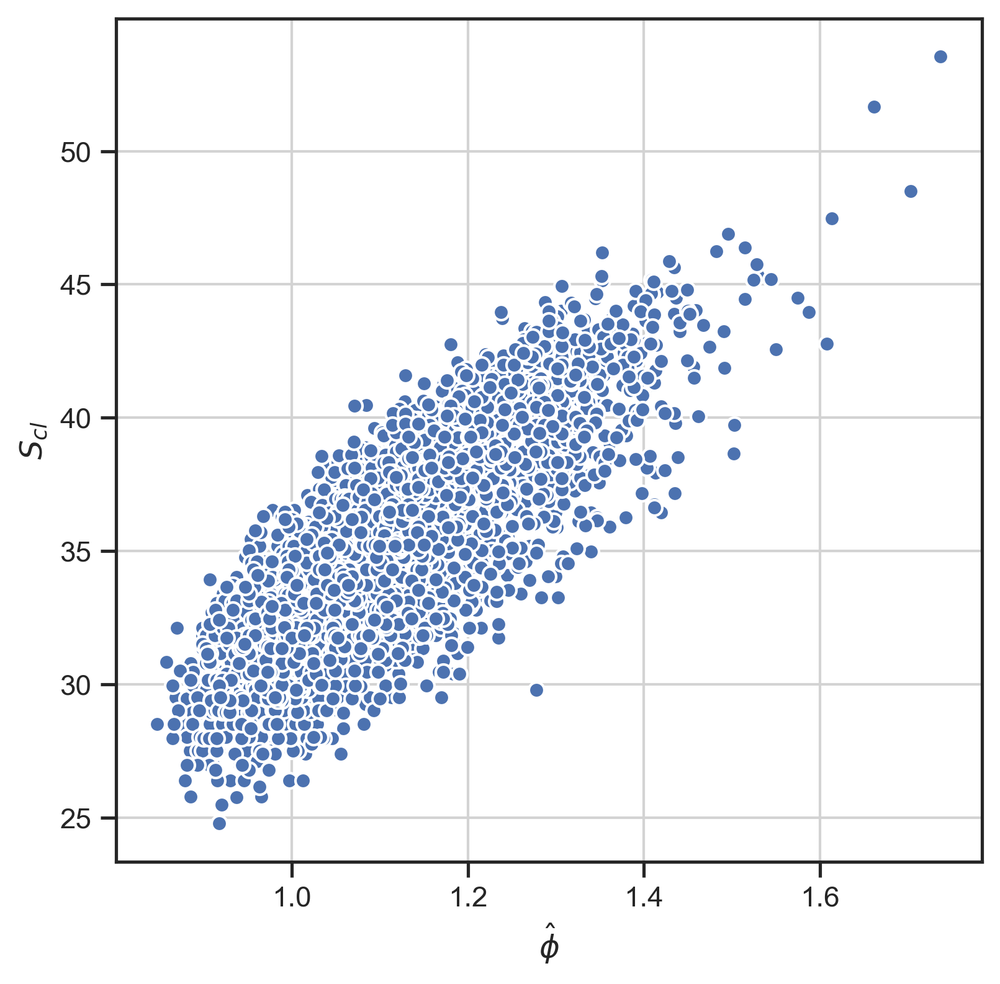

In [30]:
#Figure 5
fig = plt.figure(figsize=(6,6),dpi=300)
plt.scatter(df_corr_S_DI.DI_r2t99w21,df_corr_S_DI.S_INC50,edgecolors='white')
plt.rc('grid', linestyle="-", color='lightgrey')
plt.grid()
plt.ylabel('$S_{cl}$')
plt.xlabel('$\hat \phi$');

In [23]:
def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            #pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 6)
            pvalues[r][c] = pearsonr(df[r], df[c])[1]
    return pvalues

In [24]:
calculate_pvalues(df_corr_S_DI) 

,HYBAS_ID,S_H10,S_AVG10,S_SQ10,S_H15,S_AVG15,S_SQ15,S_H20,S_AVG20,S_SQ20,...,S_AVG30,S_SQ30,S_H50,S_AVG50,S_SQ50,S_INC15,S_INC20,S_INC30,S_INC50,DI_r2t99w21
HYBAS_ID,0,4.6299e-31,2.76346e-33,1.39159e-33,6.60768e-31,1.76868e-31,6.39931e-33,3.28552e-30,3.70985e-24,4.51902e-30,...,6.83301e-19,6.79368e-27,2.17185e-30,4.72715e-20,1.32995e-27,8.99581e-34,1.0334e-33,2.1907e-31,8.29788e-27,1.09603e-45
S_H10,4.6299e-31,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
S_AVG10,2.76346e-33,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
S_SQ10,1.39159e-33,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
S_H15,6.60768e-31,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
S_AVG15,1.76868e-31,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
S_SQ15,6.39931e-33,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
S_H20,3.28552e-30,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
S_AVG20,3.70985e-24,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
S_SQ20,4.51902e-30,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


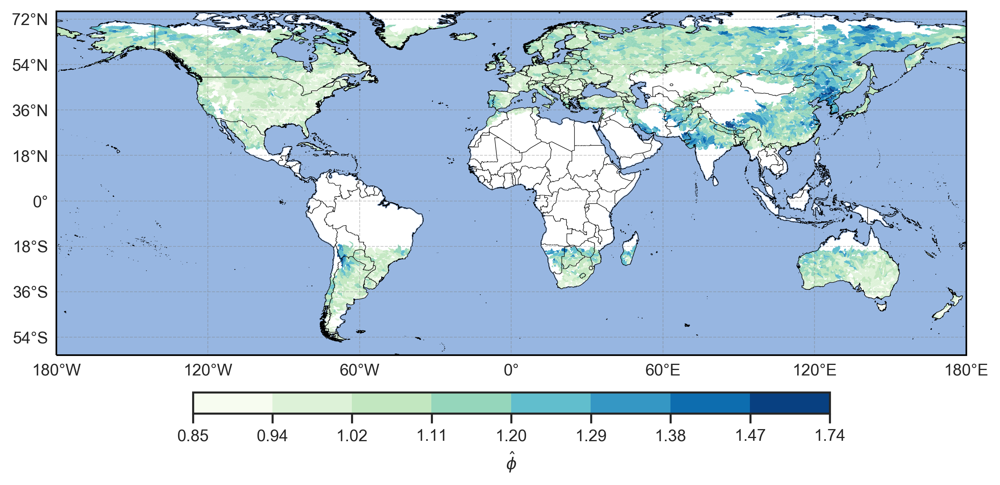

In [17]:
#Appendix D: map of dispersion index (phi)

d2 = phi_gdf
pm2 = 'DI_r2t99w21'
fts = 10

bnds = d2.geometry.bounds
lo_min = math.floor(min(bnds.minx))
lo_max = math.ceil(max(bnds.maxx))
la_min = math.floor(min(bnds.miny))
la_max = math.ceil(max(bnds.maxy))
mn2 = d2[pm2].min()
mx2 = d2[pm2].max()

bounds2 = [0.84690054, 0.93593135, 1.02496216, 1.11399296, 1.20302377, 1.29205457,
           1.38108538, 1.47011618, 1.7372086]

# len(bounds) if one color = one category, otherwise len(bounds)-1
cmap = mpl.cm.get_cmap('GnBu', len(bounds2)-1)
norm2 = mpl.colors.BoundaryNorm(bounds2, cmap.N)
cbar2 = plt.cm.ScalarMappable(norm=norm2, cmap=cmap)

projection=ccrs.PlateCarree()
fig = plt.figure(figsize=(10,6),dpi=300)
ax = plt.axes(projection=projection)
ax.set_extent([lo_min,lo_max,la_min-5,la_max+5],projection)

d2.plot(ax=ax, column=pm2, cmap=cmap, norm=norm2, edgecolor='none', linewidth=0.25, legend=False)

cb2 = fig.colorbar(cbar2, ax=ax, pad=0.07, orientation='horizontal', format="%0.2f",  # "%0.2f","%d"
                  spacing='uniform', shrink=0.7, fraction=0.05, label='', aspect=30)

cb2.ax.tick_params(labelsize=fts)
cb2.set_label(label='$\hat \phi$',size=fts)

ax.set_extent([lo_min,lo_max,la_min-5,la_max+5],projection)
ax.add_feature(cfeature.COASTLINE.with_scale('10m'),linestyle='-',linewidth=0.33)
ax.add_feature(cfeature.BORDERS.with_scale('10m'),linestyle='-',linewidth=0.33)
gl = ax.gridlines(crs=projection, draw_labels=True,
                linewidth=0.5, color='gray', alpha=0.4, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
gl.xlabel_style = {'size': fts}
gl.ylabel_style = {'size': fts}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
ax.add_feature(cfeature.OCEAN.with_scale('10m'))

In [18]:
# Color maps
colors_rgb = [(102/255,166/255,30/255),(231/255,41/255,138/255),(230/255,171/255,2/255)]
N = 15
green = np.ones((N, 4))
green[:, 0] = np.linspace(1, 102/255, N)
green[:, 1] = np.linspace(1, 166/255, N)
green[:, 2] = np.linspace(1, 30/255, N)
green_cmp = ListedColormap(green[3:15,:])
red = np.ones((N, 4))
red[:, 0] = np.linspace(1, 231/255, N)
red[:, 1] = np.linspace(1, 41/255, N)
red[:, 2] = np.linspace(1, 138/255, N)
red_cmp = ListedColormap(red[3:15,:])
purple = np.ones((N, 4))
purple[:, 0] = np.linspace(1, 230/255, N)
purple[:, 1] = np.linspace(1, 171/255, N)
purple[:, 2] = np.linspace(1, 2/255, N)
purple_cmp = ListedColormap(purple[3:15,:])

In [19]:
d_list = [col for col in final if col.startswith('NS_INC50')]
d = {}
for name in d_list:
    d[name] = pd.DataFrame()
for ns,k in zip(d_list,d.keys()):
    d[k] = final[ns] - final['NS_INC50_r2t99w21']
delta = pd.DataFrame.from_dict(d)

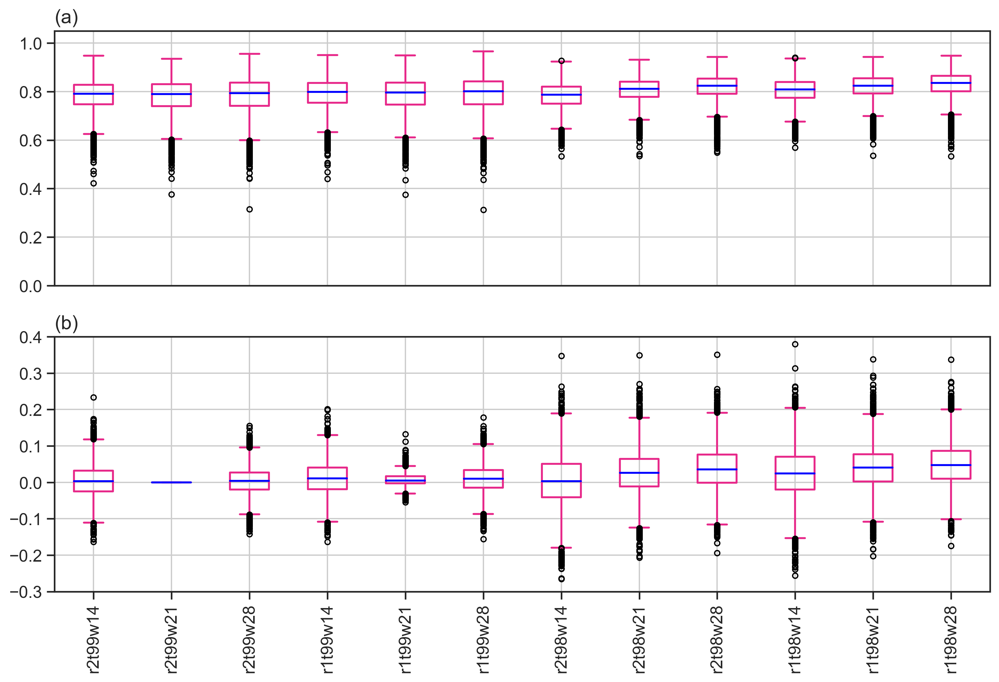

In [32]:
#Figure 8

fig, axes = plt.subplots(2,1, figsize=(13,8),dpi=300)
x = np.arange(1,13,1)
fts = 15
outliers = dict(markersize=4)
lw = 1.5
boxprops = dict(linewidth=lw)
medianprops = dict(linewidth=lw)
whiskerprops = dict(linewidth=lw)
capprops = dict(linewidth=lw)
c = mpl.colors.to_hex(colors_rgb[1])
color = {"boxes": c,"whiskers": c,"medians": "Blue","caps": c}

g1 = final.loc[:, final.columns.str.startswith('NS_INC50')].plot.box(ax=axes[0],fontsize=15,rot=90,
                                                                    flierprops=outliers,boxprops=boxprops,
                                                                    medianprops=medianprops,capprops=capprops,
                                                                   whiskerprops=whiskerprops,color=color,grid=True)

axes[0].set_title('(a)',loc='left',fontsize=fts)
g1.set(xticklabels=[])
g1.tick_params(bottom=False, labelsize=fts-2)
g1.set_ylim([0, 1.05])

g2 = delta.plot.box(ax=axes[1],fontsize=15,rot=90,flierprops=outliers,boxprops=boxprops,
                                                                    medianprops=medianprops,capprops=capprops,
                                                                   whiskerprops=whiskerprops,color=color,grid=True)
axes[1].set_title('(b)',loc='left',fontsize=fts)
start = -0.3
end = 0.4
stepsize= 0.05
g2.set_ylim([start, end])
g2.tick_params(labelsize=fts-2)
plt.yticks(np.arange(start, end+0.1, 0.1));

labels = [col for col in final if col.startswith('NS_INC50')]
labels = [e[9:] for e in labels]
plt.xticks(x, labels);

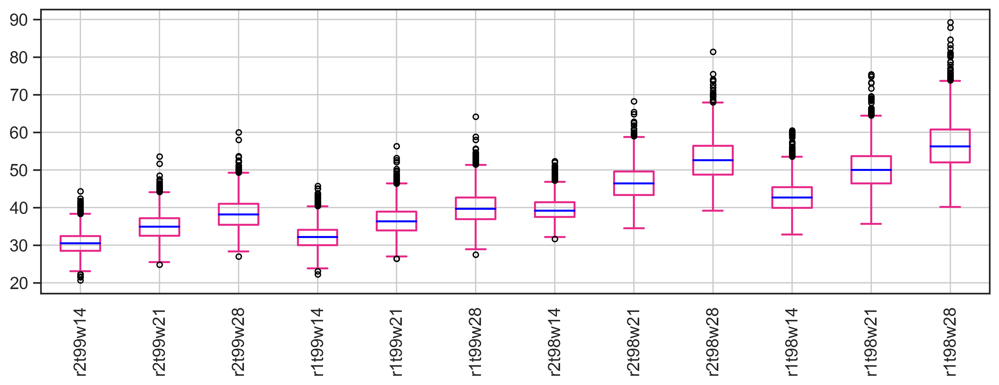

In [34]:
#Appendix C

fig, ax = plt.subplots(1,1, figsize=(13,4),dpi=300)
x = np.arange(1,13,1)
fts = 15
outliers = dict(markersize=4)
lw = 1.5
boxprops = dict(linewidth=lw)
medianprops = dict(linewidth=lw)
whiskerprops = dict(linewidth=lw)
capprops = dict(linewidth=lw)
c = mpl.colors.to_hex(colors_rgb[1])
color = {"boxes": c,"whiskers": c,"medians": "Blue","caps": c}

g1 = final.loc[:, final.columns.str.startswith('S_INC50')].plot.box(ax=ax,fontsize=15,rot=90,
                                                                    flierprops=outliers,boxprops=boxprops,
                                                                    medianprops=medianprops,capprops=capprops,
                                                                   whiskerprops=whiskerprops,color=color,grid=True)

g1.set(xticklabels=[])
g1.tick_params(bottom=False, labelsize=fts-2)
#g1.set_ylim([0, 1.05])

labels = [col for col in final if col.startswith('S_INC50')]
labels = [e[8:] for e in labels]
plt.xticks(x, labels);

In [11]:
#Table D1
final.loc[:, final.columns.str.startswith('S_INC50')].describe()

,S_INC50_r2t99w14,S_INC50_r2t99w21,S_INC50_r2t99w28,S_INC50_r1t99w14,S_INC50_r1t99w21,S_INC50_r1t99w28,S_INC50_r2t98w14,S_INC50_r2t98w21,S_INC50_r2t98w28,S_INC50_r1t98w14,S_INC50_r1t98w21,S_INC50_r1t98w28
count,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000
mean,30.507450,34.985400,38.367212,32.127590,36.575323,39.984922,39.580927,46.664116,52.767179,42.867304,50.304040,56.614575
std,2.883191,3.348331,3.850639,3.105803,3.623433,4.140028,2.935245,4.350770,5.293153,3.799297,5.148910,6.098440
min,20.635037,24.791090,26.965847,22.285409,26.394940,27.506391,31.685874,34.468121,39.133241,32.854571,35.616959,40.151513
25%,28.499713,32.469462,35.447255,29.954151,33.919915,36.921538,37.493905,43.325079,48.707667,39.940750,46.373369,51.988509
50%,30.459390,34.886494,38.114935,32.118211,36.296923,39.650386,39.159065,46.373369,52.561854,42.624422,50.016584,56.208775
75%,32.424529,37.140611,40.968912,34.107867,38.903455,42.689683,41.365402,49.536248,56.397325,45.373369,53.626633,60.696174
max,44.346983,53.544102,59.939401,45.751966,56.325812,64.151549,52.289059,68.221442,81.352337,60.502807,75.410654,89.236341


In [40]:
#Table E1
final.loc[:, final.columns.str.startswith('NS_INC50')].describe()

,NS_INC50_r2t99w14,NS_INC50_r2t99w21,NS_INC50_r2t99w28,NS_INC50_r1t99w14,NS_INC50_r1t99w21,NS_INC50_r1t99w28,NS_INC50_r2t98w14,NS_INC50_r2t98w21,NS_INC50_r2t98w28,NS_INC50_r1t98w14,NS_INC50_r1t98w21,NS_INC50_r1t98w28
count,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000
mean,0.783833,0.780199,0.783693,0.791099,0.787206,0.789657,0.783528,0.806685,0.818059,0.804310,0.820245,0.829229
std,0.063169,0.068489,0.071716,0.062852,0.069216,0.072310,0.051602,0.048313,0.049539,0.050384,0.048610,0.050410
min,0.421785,0.375987,0.315365,0.440627,0.374480,0.312334,0.533520,0.534694,0.547876,0.568614,0.535125,0.533257
25%,0.746864,0.739196,0.741126,0.754184,0.746318,0.747870,0.749453,0.777373,0.789993,0.773597,0.792232,0.800944
50%,0.790208,0.788913,0.793555,0.798226,0.796184,0.800317,0.786767,0.810965,0.823470,0.808615,0.824222,0.835153
75%,0.828216,0.829531,0.836045,0.835605,0.837085,0.842079,0.819561,0.840356,0.852862,0.838965,0.854813,0.864736
max,0.947377,0.934322,0.955196,0.950438,0.949013,0.965759,0.926457,0.931473,0.942396,0.939940,0.942658,0.947005


In [40]:
#Table E2
delta.describe()

,NS_INC50_r2t99w14,NS_INC50_r2t99w21,NS_INC50_r2t99w28,NS_INC50_r1t99w14,NS_INC50_r1t99w21,NS_INC50_r1t99w28,NS_INC50_r2t98w14,NS_INC50_r2t98w21,NS_INC50_r2t98w28,NS_INC50_r1t98w14,NS_INC50_r1t98w21,NS_INC50_r1t98w28
count,6466.000000,6466.0,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000,6466.000000
mean,0.003634,0.0,0.003494,0.010900,0.007007,0.009458,0.003329,0.026486,0.037860,0.024111,0.040046,0.049030
std,0.043827,0.0,0.035917,0.044525,0.016062,0.038025,0.070894,0.059413,0.058753,0.070374,0.058485,0.058179
min,-0.163266,0.0,-0.141948,-0.163507,-0.054620,-0.155845,-0.265323,-0.207033,-0.194536,-0.256287,-0.202877,-0.174534
25%,-0.025345,0.0,-0.019649,-0.019206,-0.002554,-0.014780,-0.041390,-0.011465,-0.001161,-0.019676,0.002413,0.009682
50%,0.003024,0.0,0.003965,0.010351,0.004547,0.009472,0.003317,0.026343,0.035657,0.024524,0.040312,0.046849
75%,0.032073,0.0,0.026490,0.040476,0.016493,0.033236,0.050983,0.064295,0.075701,0.070224,0.076900,0.085940
max,0.233223,0.0,0.155269,0.200764,0.131878,0.177951,0.347137,0.348913,0.350894,0.379199,0.337892,0.336942


In [19]:
#Load data for significance test of S_cl (Figure 6b)
obs = pd.read_csv(path + "/obs_metrics_all.RData")
obs_gdf = pd.merge(hybas_data_gdf,obs,on=['HYBAS_ID'],how='inner')

#Make significance test for p-value = 0.01
conditions = [
    (obs_gdf['pval'] < 0.01),
    (obs_gdf['pval'] >= 0.01)]

values = ['Significant', 'Not significant']

obs_gdf['sign_0.01'] = np.select(conditions, values)

In [37]:
obs_gdf['sign_0.01'].describe()

count                6466
unique                  2
top       Not significant
freq                 3737
Name: sign_0.01, dtype: object

In [34]:
#Color map for Figure 6b
cmap_t = sns.choose_colorbrewer_palette('qualitative') #qualitative, sequential, diverging

interactive(children=(Dropdown(description='name', options=('Set1', 'Set2', 'Set3', 'Paired', 'Accent', 'Paste…

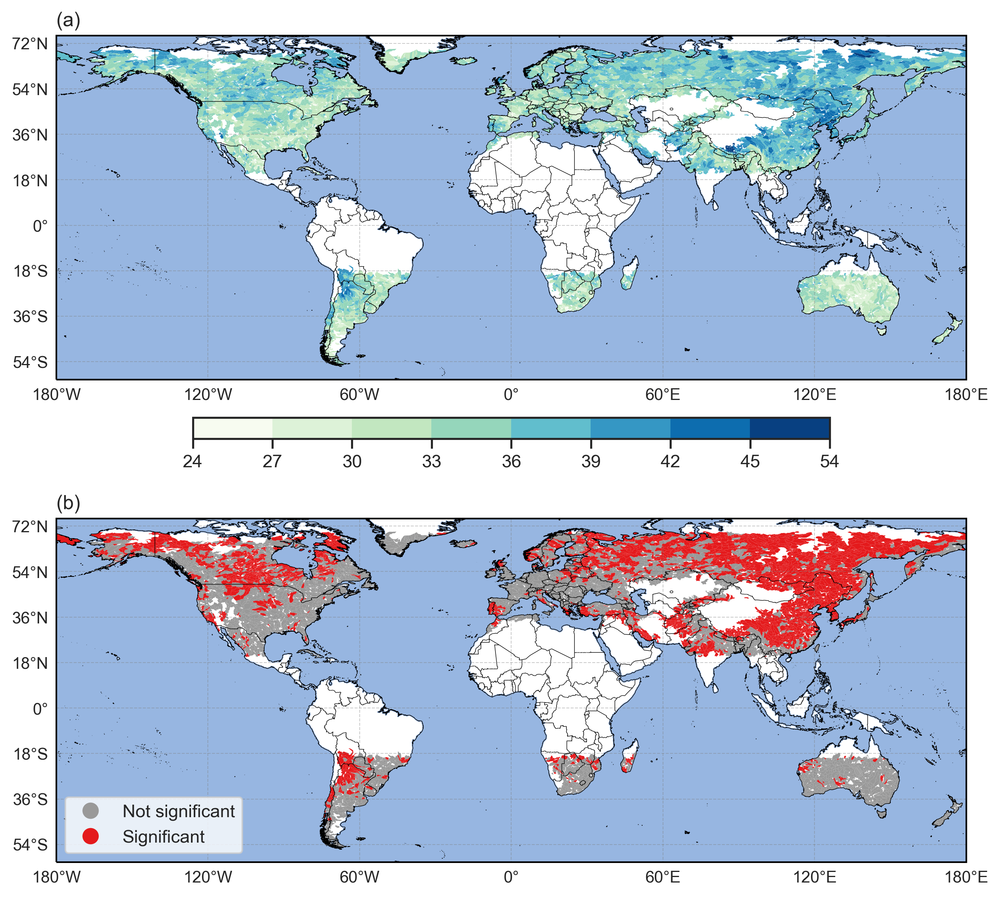

In [36]:
#Figure 6 - Maps of S_cl and p-values

d1 = eps_gdf['eps_r2t99w21']
pm1 = 'S_INC50'
d2 = obs_gdf
pm2 = 'sign_0.01'

fts = 10

bnds = d1.geometry.bounds
lo_min = math.floor(min(bnds.minx))
lo_max = math.ceil(max(bnds.maxx))
la_min = math.floor(min(bnds.miny))
la_max = math.ceil(max(bnds.maxy))
mn1 = d1[pm1].min()
mx1 = d1[pm1].max()
mn2 = d2[pm2].min()
mx2 = d2[pm2].max()

bounds1 = [24.79108971, 27.66639093, 30.54169215, 33.41699336, 36.29229458, 39.1675958,
           42.04289702, 44.91819824, 53.54410189]
bounds1 = [24, 27, 30, 33, 36, 39, 42, 45, 54]
bounds2 = [0,0.0001,1]

# len(bounds) if one color = one category, otherwise len(bounds)-1
cmap1 = mpl.cm.get_cmap('GnBu', len(bounds1)-1)
cmap2 = mpl.colors.ListedColormap([cmap_t[8],cmap_t[0]])

norm1 = mpl.colors.BoundaryNorm(bounds1, cmap1.N)
cbar1 = plt.cm.ScalarMappable(norm=norm1, cmap=cmap1)

projection=ccrs.PlateCarree()
fig, axes = plt.subplots(2,1, figsize=(10,12),dpi=300, subplot_kw=dict(projection=projection),
                        gridspec_kw=dict(hspace=-0.05))

d1.plot(ax=axes[0], column=pm1, cmap=cmap1, norm=norm1, edgecolor='none', linewidth=0.25, legend=False)
axes[0].set_title('(a)',loc='left')

d2.plot(ax=axes[1], column=pm2, cmap=cmap2, edgecolor='none',
        linewidth=0.25, legend=True, legend_kwds=dict(loc='lower left'))
axes[1].set_title('(b)',loc='left')

cb1 = fig.colorbar(cbar1, ax=axes[0], pad=0.07, orientation='horizontal', format="%d",  # "%0.2f","%d"
                  spacing='uniform', shrink=0.7, fraction=0.05, label='', aspect=30)

for ax in axes.flat:
    ax.set_extent([lo_min,lo_max,la_min-5,la_max+5],projection)
    ax.add_feature(cfeature.COASTLINE.with_scale('10m'),linestyle='-',linewidth=0.33)
    ax.add_feature(cfeature.BORDERS.with_scale('10m'),linestyle='-',linewidth=0.33)
    gl = ax.gridlines(crs=projection, draw_labels=True,
                  linewidth=0.5, color='gray', alpha=0.4, linestyle='--')
    gl.xlabels_top = False
    gl.ylabels_right = False
    gl.xlabel_style = {'size': fts}
    gl.ylabel_style = {'size': fts}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    ax.add_feature(cfeature.OCEAN.with_scale('10m'))

In [10]:
def all_dict_to_df(d):
    df = pd.concat(d.values(), ignore_index=True)
    df['HYBAS_ID_count'] = df.groupby('HYBAS_ID')['HYBAS_ID'].transform('count')
    reduced = df.drop_duplicates(['HYBAS_ID'])
    df = pd.merge(hybas_data_gdf,reduced[['HYBAS_ID','HYBAS_ID_count']],on=['HYBAS_ID'],how='inner')
    return df
def single_dict_to_df(d,param):
    df = d[param]
    df = pd.merge(hybas_data_gdf,df[['HYBAS_ID']],on=['HYBAS_ID'],how='inner')
    return df
def make_excluded(df):
    temp = pd.merge(qnts_gdf_midlat_TP10, df, on=['HYBAS_ID'], how='outer', suffixes=('','_y'), indicator=True)
    excluded = temp.loc[temp['_merge']=='left_only',][qnts_gdf_midlat_TP10.columns]
    return excluded

In [11]:
#Data for Figure 7 and 9
metric = 'INC50'
S_pm_list = [col for col in final if col.startswith('S_' + metric)]
NS_pm_list = [col for col in final if col.startswith('NS_' + metric)]
qS75 = final[S_pm_list].quantile(0.75)
qNS75 = final[NS_pm_list].quantile(0.75)
qS25 = final[S_pm_list].quantile(0.25)
qNS25 = final[NS_pm_list].quantile(0.25)
#high clustering contributing to large accumulations
d_hcla = {}
#low clustering contributing to large accumulations
d_lcla = {}
#high clustering not contributing to large accumulations
d_hcnla = {}
for name in S_pm_list:
    d_hcla[name] = pd.DataFrame()
    d_lcla[name] = pd.DataFrame()
    d_hcnla[name] = pd.DataFrame()
for q1,q2,s,ns,k in zip(qS75,qNS75,S_pm_list,NS_pm_list,d_hcla.keys()):
    d_hcla[k] = final[final[s].gt(q1) & final[ns].gt(q2)]
for q1,q2,s,ns,k in zip(qS25,qNS75,S_pm_list,NS_pm_list,d_lcla.keys()):
    d_lcla[k] = final[final[s].lt(q1) & final[ns].gt(q2)]
for q1,q2,s,ns,k in zip(qS75,qNS25,S_pm_list,NS_pm_list,d_hcnla.keys()):
    d_hcnla[k] = final[final[s].gt(q1) & final[ns].lt(q2)]

field = 'S_INC50_r2t99w21'
hcla = all_dict_to_df(d_hcla)
hcla_s = single_dict_to_df(d_hcla,field)
lcla = all_dict_to_df(d_lcla)
lcla_s = single_dict_to_df(d_lcla,field)
hcnla = all_dict_to_df(d_hcnla)
hcnla_s = single_dict_to_df(d_hcnla,field)

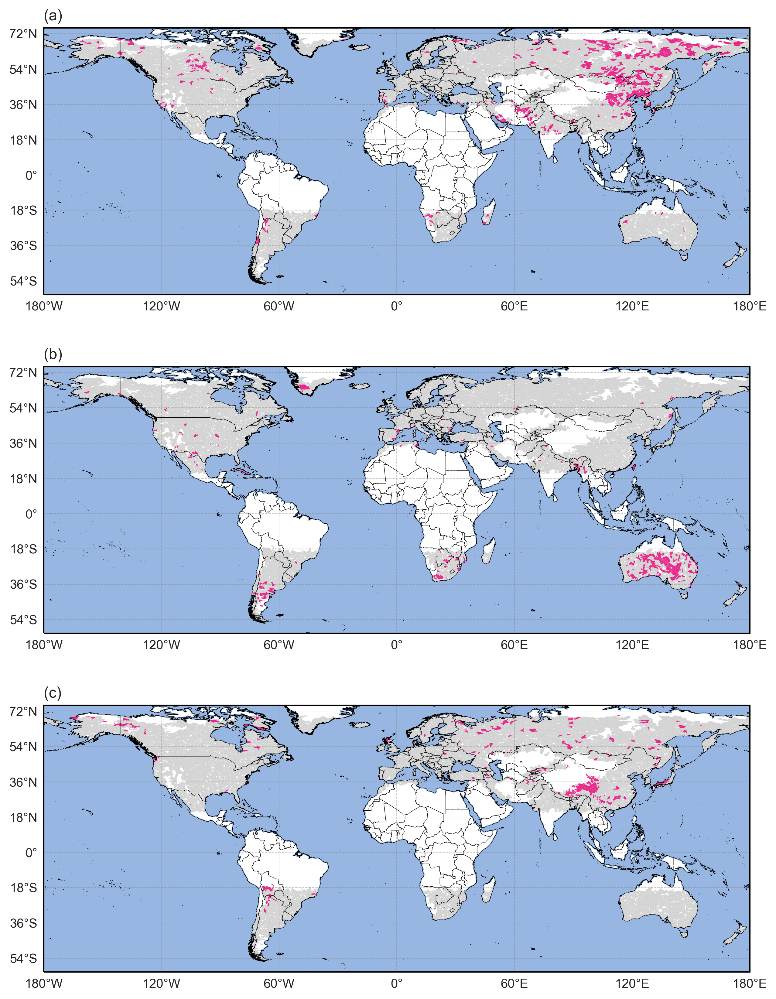

In [38]:
#Figure 7

exc_hcla = make_excluded(hcla_s)
exc_lcla = make_excluded(lcla_s)
exc_hcnla = make_excluded(hcnla_s)
fts = 10

bnds = qnts_gdf_midlat_TP10.geometry.bounds
lo_min = math.floor(min(bnds.minx))
lo_max = math.ceil(max(bnds.maxx))
la_min = math.floor(min(bnds.miny))
la_max = math.ceil(max(bnds.maxy))

projection=ccrs.PlateCarree()
fig, axes = plt.subplots(3,1, figsize=(10,16),dpi=300, subplot_kw=dict(projection=projection),
                        gridspec_kw=dict(hspace=-0.2))

hcla_s.geometry.plot(ax=axes[0], color=mpl.colors.to_hex(colors_rgb[1]),edgecolor='none')
exc_hcla.geometry.plot(ax=axes[0], color='lightgrey',edgecolor='none')
axes[0].set_title('(a)',loc='left')
lcla_s.geometry.plot(ax=axes[1], color=mpl.colors.to_hex(colors_rgb[1]),edgecolor='none')
exc_lcla.geometry.plot(ax=axes[1], color='lightgrey',edgecolor='none')
axes[1].set_title('(b)',loc='left')
hcnla_s.geometry.plot(ax=axes[2], color=mpl.colors.to_hex(colors_rgb[1]),edgecolor='none')
exc_hcnla.geometry.plot(ax=axes[2], color='lightgrey',edgecolor='none')
axes[2].set_title('(c)',loc='left')

for ax in axes.flat:
    ax.set_extent([lo_min,lo_max,la_min-5,la_max+5],projection)
    ax.add_feature(cfeature.COASTLINE.with_scale('10m'),linestyle='-',linewidth=0.33)
    ax.add_feature(cfeature.BORDERS.with_scale('10m'),linestyle='-',linewidth=0.33)
    gl = ax.gridlines(crs=projection, draw_labels=True,
                  linewidth=0.5, color='gray', alpha=0.4, linestyle='--')
    gl.xlabels_top = False
    gl.ylabels_right = False
    gl.xlabel_style = {'size': fts}
    gl.ylabel_style = {'size': fts}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    ax.add_feature(cfeature.OCEAN.with_scale('10m'))

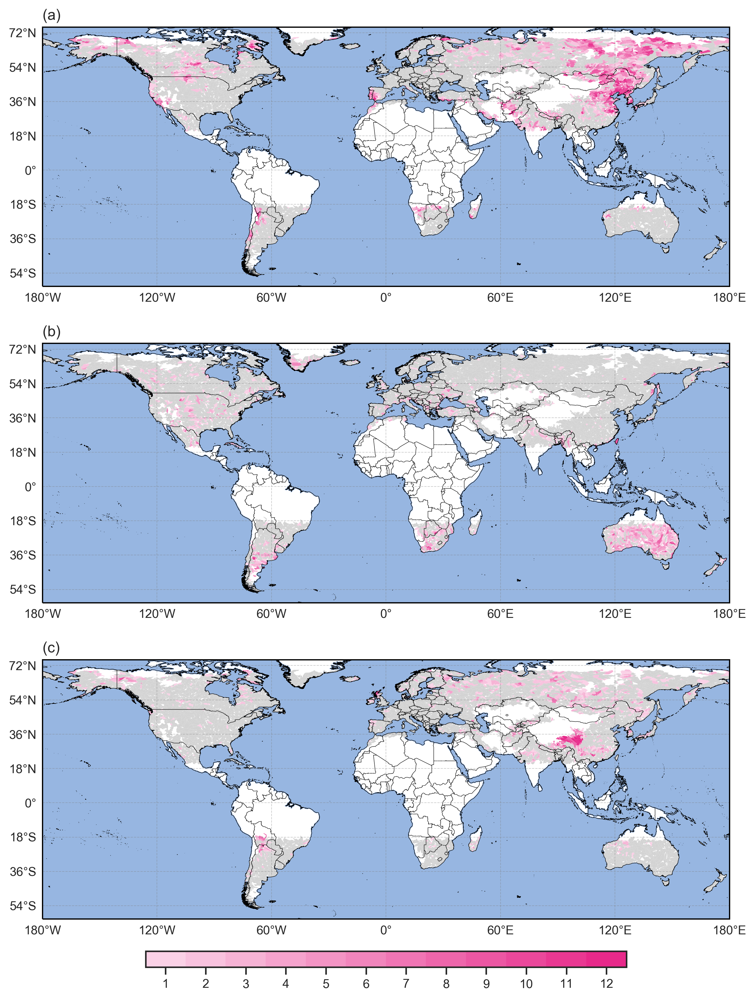

In [31]:
#Figure 9

exc_hcla = make_excluded(hcla)
exc_lcla = make_excluded(lcla)
exc_hcnla = make_excluded(hcnla)
fts = 10
pm = 'HYBAS_ID_count'

bnds = qnts_gdf_midlat_TP10.geometry.bounds
lo_min = math.floor(min(bnds.minx))
lo_max = math.ceil(max(bnds.maxx))
la_min = math.floor(min(bnds.miny))
la_max = math.ceil(max(bnds.maxy))

mn1 = hcla[pm].min()
mx1 = hcla[pm].max()
mn2 = lcla[pm].min()
mx2 = lcla[pm].max()
mn3 = hcnla[pm].min()
mx3 = hcnla[pm].max()

bounds1 = np.arange(mn1,mx1+2) #if one color = one category, add +1 (+2 in total)
bounds2 = np.arange(mn2,mx2+2)
bounds3 = np.arange(mn3,mx3+2)

cmap1 = red_cmp
cmap2 = purple_cmp
cmap3 = green_cmp
norm1 = mpl.colors.BoundaryNorm(bounds1, cmap1.N)
norm2 = mpl.colors.BoundaryNorm(bounds2, cmap1.N)
norm3 = mpl.colors.BoundaryNorm(bounds3, cmap1.N)
cbar1 = plt.cm.ScalarMappable(norm=norm1, cmap=cmap1)
cbar2 = plt.cm.ScalarMappable(norm=norm2, cmap=cmap1)
cbar3 = plt.cm.ScalarMappable(norm=norm3, cmap=cmap1)

projection=ccrs.PlateCarree()
fig, axes = plt.subplots(3,1, figsize=(10,16),dpi=300, subplot_kw=dict(projection=projection),
                        gridspec_kw=dict(hspace=-0.1))

hcla.plot(ax=axes[0], column=pm, cmap=cmap1, norm=norm1, edgecolor='none', linewidth=0.25, legend=False)
exc_hcla.geometry.plot(ax=axes[0], color='lightgrey',edgecolor='none')
axes[0].set_title('(a)',loc='left')
lcla.plot(ax=axes[1], column=pm, cmap=cmap1, norm=norm1, edgecolor='none', linewidth=0.25, legend=False)
exc_lcla.geometry.plot(ax=axes[1], color='lightgrey',edgecolor='none')
axes[1].set_title('(b)',loc='left')
hcnla.plot(ax=axes[2], column=pm, cmap=cmap1, norm=norm1, edgecolor='none', linewidth=0.25, legend=False)
exc_hcnla.geometry.plot(ax=axes[2], color='lightgrey',edgecolor='none')
axes[2].set_title('(c)',loc='left')

cb1 = fig.colorbar(cbar1, ax=axes.flat, pad=0.03, orientation='horizontal', format="%d",  # "%0.2f","%d"
                  spacing='uniform', shrink=0.7, fraction=0.05, label='', aspect=30)

tick_locs1 = (np.arange(bounds1[0],bounds1[len(bounds1)-1]) + 0.5) #if one color = one category
cb1.set_ticks(tick_locs1) #if one color = one category
cb1.set_ticklabels(np.arange(bounds1[0],bounds1[len(bounds1)-1])) #if one color = one category
cb1.ax.tick_params(labelsize=fts)

for ax in axes.flat:
    ax.set_extent([lo_min,lo_max,la_min-5,la_max+5],projection)
    ax.add_feature(cfeature.COASTLINE.with_scale('10m'),linestyle='-',linewidth=0.33)
    ax.add_feature(cfeature.BORDERS.with_scale('10m'),linestyle='-',linewidth=0.33)
    gl = ax.gridlines(crs=projection, draw_labels=True,
                  linewidth=0.5, color='gray', alpha=0.4, linestyle='--')
    gl.xlabels_top = False
    gl.ylabels_right = False
    gl.xlabel_style = {'size': fts}
    gl.ylabel_style = {'size': fts}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    ax.add_feature(cfeature.OCEAN.with_scale('10m'))

In [11]:
catchments = pd.merge(qnts_gdf_midlat_TP10,eps_gdf['eps_r2t99w21'][all_list],on=['HYBAS_ID'],how='inner')
catchments = catchments.loc[:, catchments.columns != 'geometry']
#catchments.to_csv('catchments.csv', header=True, encoding='utf-8', index=False)

In [12]:
#Correlations of S_cl and S_r with catchment area
catchments[['SUB_AREA_x','S_INC50','NS_INC50']].corr(method='spearman')

,SUB_AREA_x,S_INC50,NS_INC50
SUB_AREA_x,1.000000,-0.039178,-0.015789
S_INC50,-0.039178,1.000000,0.237026
NS_INC50,-0.015789,0.237026,1.000000


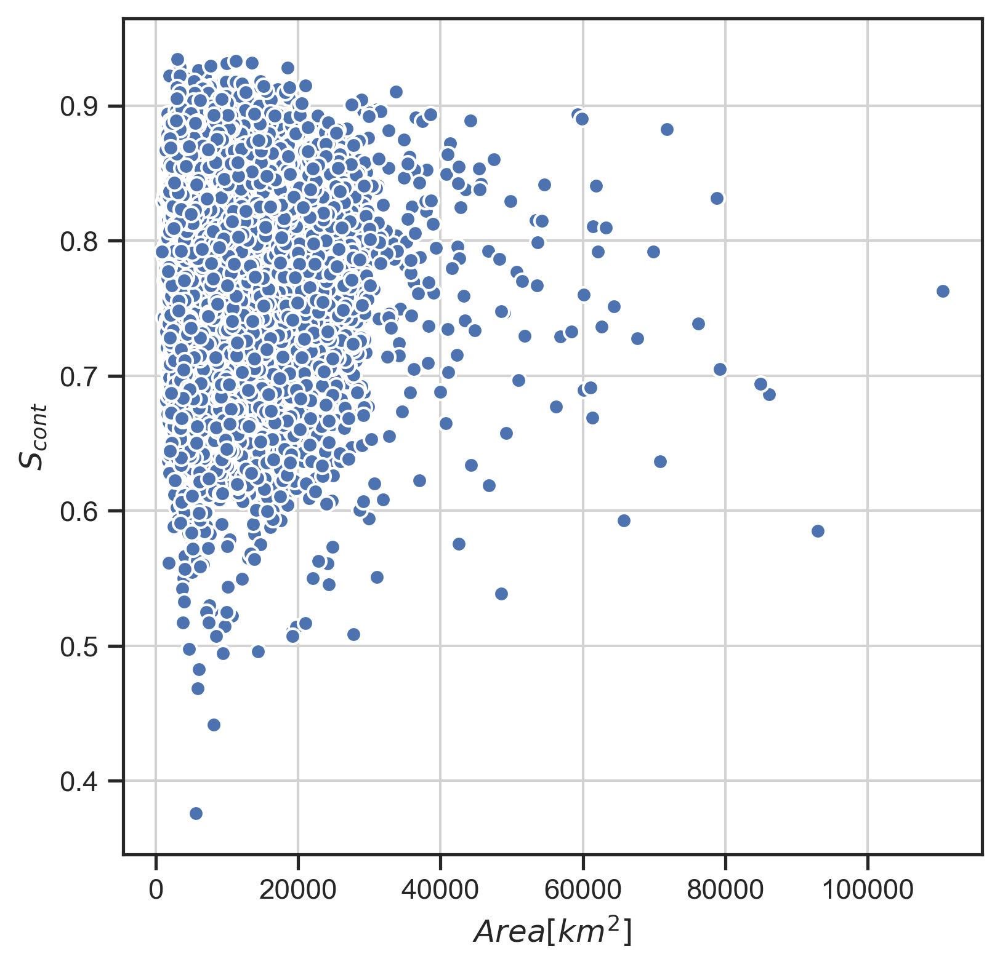

In [29]:
#Correlations of S_cl and S_r with catchment area
fig = plt.figure(figsize=(6,6),dpi=300)
plt.scatter(catchments.SUB_AREA_x,catchments.NS_INC50,edgecolors='white')
plt.rc('grid', linestyle="-", color='lightgrey')
plt.grid()
plt.ylabel('$S_{cont}$')
plt.xlabel('$Area [km^2]$');